## Fake News Prediction using Natural Language Processing 

In [4]:
## importing necessary packages

import pandas as pd
import numpy as np
import spacy
import re

In [5]:
# loading the dataset
df = pd.read_csv('train.csv', error_bad_lines=False,encoding='iso-8859-1', warn_bad_lines=True)
df.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didnât Even See Comeyâs...,Darrell Lucus,House Dem Aide: We Didnât Even See Comeyâs...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [6]:
# dimension of the dataframe
df.shape
# selecting only first 6000 rows because the dataset is big to be handled
#df = df.iloc[:6000,:]

(20800, 5)

In [7]:
# checking for null values 
df.isnull().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [8]:
# dropping na values and resetting the index
df = df.dropna().reset_index()

In [9]:
# checking shape after removal of na values
df.shape

(18285, 6)

In [10]:
# we dont need "id" column, so dropping it
df = df.drop(['id'], axis=1)
df.head(16)

,index,title,author,text,label
0,0,House Dem Aide: We Didnât Even See Comeyâs...,Darrell Lucus,House Dem Aide: We Didnât Even See Comeyâs...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1
5,5,Jackie Mason: Hollywood Would Love Trump if He...,Daniel Nussbaum,"In these trying times, Jackie Mason is the Voi...",0
6,7,BenoÃ®t Hamon Wins French Socialist Partyâs ...,Alissa J. Rubin,"PARIS â France chose an idealistic, tradi...",0
7,9,"A Back-Channel Plan for Ukraine and Russia, Co...",Megan Twohey and Scott Shane,A week before Michael T. Flynn resigned as nat...,0
8,10,Obamaâs Organizing for Action Partners with ...,Aaron Klein,"Organizing for Action, the activist group that...",0
9,11,"BBC Comedy Sketch ""Real Housewives of ISIS"" Ca...",Chris Tomlinson,The BBC produced spoof on the âReal Housewiv...,0


In [19]:
### removing special characters
##def removeSpecialChars(mystring):
##    mystring = mystring.lower()
##    return re.sub('[^A-Za-z0-9 ]+', '', str(mystring))

In [20]:
## storing processed text output in new column
##df['procecssed_text'] = df['text'].apply(lambda x: removeSpecialChars(x))
##df['procecssed_text'].head()

In [11]:
## removing stopwords and lemmatization using spacy
#!python -m spacy download en
#!python -m spacy download en_core_web_sm
import en_core_web_sm
# nlp = spacy.load("en_core_web_sm")
nlp = en_core_web_sm.load()


In [12]:
# function to lemmatize the sentences and removing stopwords present in it
word_corpus = []
def lemmatizeAndStopwordsRem(string):
    string = string.lower()
    string = re.sub('[^A-Za-z]+', ' ', str(string)) # removing everything except alphabets
    string = nlp(string)
    processed = []
    for word in string:
        word = word.lemma_
        if str(word) not in nlp.Defaults.stop_words:
            processed.append(word)
    processed = " ".join(processed)
    word_corpus.append(processed)
    return processed


In [13]:
# applying function on complete "text" column
df['processed'] = df['text'].apply(lambda x: lemmatizeAndStopwordsRem(x))
df['processed']

0        house dem aide -PRON- didn t comey s letter ja...
1        feel -PRON- life circle roundabout head straig...
2        truth -PRON- fire october tension intelligence...
3        videos civilian kill single airstrike identify...
4        print iranian woman sentence year prison iran ...
                               ...                        
18280    rapper t unload black celebrity meet donald tr...
18281    green bay packer lose washington redskin week ...
18282    macy s today grow union great american retaili...
18283    nato russia hold parallel exercise balkans pre...
18284      david swanson author activist journalist rad...
Name: processed, Length: 18285, dtype: object

In [14]:
# CountVectorizer to create a vector of every word(it actually counts a term frequency of every word) AKA one_hot_encoding
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range= (1,3)) # ngram_range specifies min and max size of ngrams  

In [15]:
# checking no of words in a random row
# len(max(word_corpus))
len(word_corpus[118].split(" "))
# word_corpus[50]

620

In [16]:
x = cv.fit_transform(word_corpus).toarray()
y = df['label']

In [17]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

In [18]:
cv.get_feature_names()[:2]

['aaron', 'abandon']

In [19]:
processed_df = pd.DataFrame(X_train, columns = cv.get_feature_names())
processed_df.head()

,aaron,abandon,abandon pron,abc,abc news,abe,abedin,ability,able,abortion,abroad,absence,absolute,absolutely,absorb,absurd,abu,abuse,abuse pron,academic,academy,accelerate,accept,accept pron,acceptable,acceptance,access,access pipeline,access pron,accident,accommodate,accompany,accomplish,accord,accord people,accord pron,accord report,account,account pron,accountability,...,xi,ya,yahoo,yard,yeah,year,year accord,year ago,year ago pron,year later,year mr,year old,year prison,year pron,year year,yell,yellow,yemen,yes,yes pron,yesterday,yiannopoulos,yield,york,york city,york pron,york times,yorker,young,young man,young people,young woman,youth,youtube,zealand,zero,zika,zionist,zone,zu
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,18,0,0,0,0,0,0,0,4,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Naive Bayes Algorithm  

In [20]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, plot_confusion_matrix
classifier = MultinomialNB()

In [21]:
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)

In [22]:
accuracy = accuracy_score(y_test, predictions)
print(accuracy)

0.8922614164615805


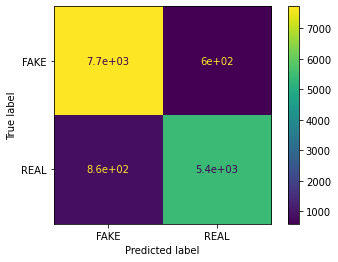

In [23]:
plot_confusion_matrix(classifier, X_train, y_train, display_labels=['FAKE','REAL'])

We can see that acccuracy of Naive Bayes is ~89%.

we will try SVM classifier which also does great in case of text data

### SVM-SGD

In [24]:
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer

In [25]:
svm_clf = SGDClassifier(loss='hinge', alpha=0.001, random_state=42)
svm_clf.fit(X_train, y_train)


SGDClassifier(alpha=0.001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=42, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [26]:
y_preds = svm_clf.predict(X_test)
accuracy= accuracy_score(y_test, y_preds)
print(accuracy)

0.9453103636860815


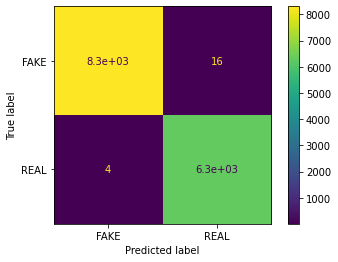

In [27]:
## creating confusion matrix 
plot_confusion_matrix(svm_clf, X_train, y_train, display_labels=['FAKE','REAL'])

Here we can see that the accuracy of SGD classifier(~0.94) is better than NaiveBayes(0.91).

### LSTM

we will try with LSTM for classification of text

In [28]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import one_hot 
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout

In [36]:
vocab_size = 10000

In [37]:
# one hot representation of words. It will create a vector for every word where only that index will be 1 where the word is present
one_hot_rep = [one_hot(word, vocab_size) for word in word_corpus]
one_hot_rep

[[3123,
  1645,
  7891,
  382,
  6826,
  9498,
  2154,
  385,
  4681,
  5672,
  5264,
  2579,
  382,
  6146,
  7659,
  8435,
  2185,
  5672,
  5264,
  962,
  9114,
  8682,
  5933,
  7983,
  921,
  1635,
  5487,
  6846,
  2669,
  5876,
  2802,
  9559,
  6016,
  9829,
  8432,
  9751,
  4786,
  9467,
  7121,
  7871,
  4115,
  9973,
  2154,
  835,
  3123,
  5424,
  7891,
  382,
  6035,
  5085,
  382,
  5670,
  5575,
  9751,
  4786,
  382,
  4468,
  2154,
  4992,
  382,
  4010,
  4681,
  6337,
  7871,
  6035,
  5283,
  3169,
  1579,
  8524,
  385,
  5283,
  8728,
  5363,
  2720,
  3213,
  1158,
  6826,
  9498,
  6846,
  382,
  2154,
  382,
  8273,
  2579,
  848,
  1158,
  6987,
  382,
  5670,
  2154,
  9544,
  848,
  6987,
  5424,
  5363,
  1011,
  3123,
  1980,
  1413,
  1085,
  1158,
  382,
  1017,
  8431,
  5283,
  382,
  6114,
  5031,
  3787,
  382,
  6563,
  1515,
  4197,
  3892,
  4681,
  1085,
  1158,
  6987,
  5672,
  5264,
  8414,
  6833,
  9467,
  1398,
  2579,
  7871,
  2719,
  7

In [38]:
# now we have to give it to embedding layer but for this we need every sentence to be of same length which can be done by using 
# pad_sequences which padds zeros at the end or start of the sentence.
sen_length = 400
embedded_doc = pad_sequences(one_hot_rep, padding='post', maxlen=sen_length)

In [39]:
len(embedded_doc)

18285

In [40]:
embedded_doc[50]

array([ 385, 5383, 7225, 8890, 1814, 9567, 1217,  745, 7414, 5950, 2098,
       7220, 2911, 9786, 4662,  382, 7414, 3057,  382, 5448, 5964, 8570,
       3367, 9057, 7414, 2259,   85,  382, 3761, 9057, 6112,  877, 1143,
       3743, 9811, 8780, 7472,  707, 5337, 9691,  811,  382, 3857,  136,
       7414, 9661,  877, 4257, 4655, 1218, 5348, 5837, 9567, 7966, 3974,
        382, 1690, 9567,   55, 7414, 8727, 2448, 5348, 8218, 4374,  382,
       5609,  382, 1320, 9498, 4890,  543, 3974,  159, 5149, 9073, 2190,
       7414, 3510, 8033, 1056, 1011, 1567, 1861, 6217, 4114, 9498, 3104,
       6341, 5317,  828, 8787,  382, 7946, 9833, 8301, 9667, 2515, 8404,
       5769, 8913, 4528, 1014,  382,  543,  847,  756, 3455, 9124, 9828,
        409, 9828, 8644, 6861, 2489, 1235,  231, 9114, 9567, 9354, 3441,
       2881, 7414, 3510,  382, 2281, 4662,  382,  847, 9343,  382, 4025,
       7414, 9567, 9498,  382, 5448, 1814, 2281, 7414,  382, 8816, 9567,
       4025, 3441, 2115, 7929,  382, 5448,  382, 19

In [41]:
# model creation
embedding_vec_features = 200 # features for creating word embedding 
model = Sequential()
model.add(Embedding(vocab_size, embedding_vec_features, input_length = sen_length))
model.add(Dropout(0.2))
model.add(LSTM(100))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid')) 


In [42]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics = ['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 400, 200)          2000000   
_________________________________________________________________
dropout (Dropout)            (None, 400, 200)          0         
_________________________________________________________________
lstm (LSTM)                  (None, 100)               120400    
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 101       
Total params: 2,120,501
Trainable params: 2,120,501
Non-trainable params: 0
_________________________________________________________________


In [43]:
# here we have to provide embedded data as input to the LSTM  
X = np.array(embedded_doc)
y = np.array(y)

In [44]:
X.shape

(18285, 400)

In [45]:
y.shape

(18285,)

In [64]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=None)

In [65]:
model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs=20, batch_size=64)

Epoch 1/20
229/229 [==============================] - 16s 70ms/step - loss: 0.1543 - accuracy: 0.9541 - val_loss: 0.1071 - val_accuracy: 0.9669
Epoch 2/20
229/229 [==============================] - 15s 65ms/step - loss: 0.1121 - accuracy: 0.9673 - val_loss: 0.1273 - val_accuracy: 0.9672
Epoch 3/20
229/229 [==============================] - 15s 66ms/step - loss: 0.1061 - accuracy: 0.9714 - val_loss: 0.1114 - val_accuracy: 0.9664
Epoch 4/20
229/229 [==============================] - 15s 66ms/step - loss: 0.0859 - accuracy: 0.9776 - val_loss: 0.1043 - val_accuracy: 0.9707
Epoch 5/20
229/229 [==============================] - 15s 65ms/step - loss: 0.0748 - accuracy: 0.9809 - val_loss: 0.1047 - val_accuracy: 0.9702
Epoch 6/20
229/229 [==============================] - 15s 65ms/step - loss: 0.0657 - accuracy: 0.9841 - val_loss: 0.1101 - val_accuracy: 0.9658
Epoch 7/20
229/229 [==============================] - 15s 65ms/step - loss: 0.0607 - accuracy: 0.9858 - val_loss: 0.1061 - val_accuracy:

In [66]:
# prediction on test data
y_pred = model.predict_classes(X_test)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


In [67]:
# checking accuracy
from sklearn.metrics import confusion_matrix, accuracy_score
confusion_matrix(y_test, y_pred)

array([[2011,   69],
       [  53, 1524]])

In [68]:
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

0.9666393218485098


LSTM accuracy is 96% which is better than SGD and Naive Bayes.  